In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
!nvidia-smi

Mon Nov  6 12:19:34 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.12             Driver Version: 535.104.12   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-32GB-LS        On  | 00000000:06:00.0 Off |                    0 |
| N/A   33C    P0              65W / 163W |      0MiB / 32768MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import SimpleBuffer
from torch.autograd import grad
from fab.utils.plotting import plot_contours, plot_marginal_pair
from experiments.make_flow import make_wrapped_normflow_realnvp
import importlib 
import models.ddpm
import models.mlp
import pdb
from tqdm import tqdm
from models.ddpm import GaussianDiffusion, TMLP
from models.mlp import MyMLP, SpectralNormMLP

import torch
import torchsde

from functorch import vmap

from torchdiffeq import odeint

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
# device = "cpu"

cuda


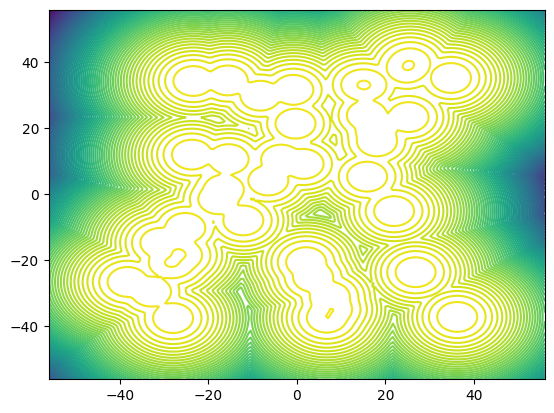

In [6]:
dim = 2
n_mixes = 40
loc_scaling = 40.0  # scale of the problem (changes how far apart the modes of each Guassian component will be)
log_var_scaling = 1.0 # variance of each Gaussian
seed = 0


if device == "cpu":
    use_gpu = False
else:
    use_gpu = True
torch.manual_seed(0)  # seed of 0 for GMM problem
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=use_gpu, true_expectation_estimation_n_samples=int(1e5))
# plot target
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-loc_scaling * 1.4, loc_scaling * 1.4)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)
target.to(device)

In [7]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0
num_samples = 10000

flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

/home/mila/t/tara.akhoundsadegh/.conda/envs/actinfenv/lib/python3.10/site-packages/torch/_tensor.py:677: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1991.)
  LU, pivots, infos = torch._lu_with_info(


In [8]:
def plot_dataset(samples, gen_samples=None):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)

   
    # plot dataset samples
    plot_marginal_pair(samples, ax=axs[0], bounds=plotting_bounds)
    axs[0].set_title("Buffer")

    if gen_samples is not None:
        plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
        # plot generated samples
        plot_marginal_pair(gen_samples, ax=axs[1], bounds=plotting_bounds)
        axs[1].set_title("Generated samples")

    else:
        #delete subplot
        fig.delaxes(axs[1])
        
    target.to(device)
    plt.show()
    return [fig]

In [9]:
def normalize(x):
    '''
        normalizes to [-1, 1]
    '''
    mins = -50 #torch.min(x, dim=0)[0]
    maxs = 50 #torch.max(x, dim=0)[0]
    ## [ 0, 1 ]
    x = (x - mins) / (maxs - mins + 1e-5)
    ## [ -1, 1 ]
    x = x * 2 - 1
    
    return x, mins, maxs

def unnormalize(x, mins, maxs):
    '''
        x : [ -1, 1 ]
    '''
    # assert x.max() <= 1 and x.min() >= -1, f'x range: ({x.min():.4f}, {x.max():.4f})'
    #x = x * std + mean
    x = (x + 1) / 2
    return x * (maxs - mins) + mins

### Dataset

In [10]:
# normalize the dataset
init_num_samples = 2048
unnorm_init_samples = target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
# unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples, global_mins_init, global_maxs_init = normalize(unnorm_init_samples)

global_mins_init = -50
global_maxs_init = 50

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size = 512, shuffle=True) 

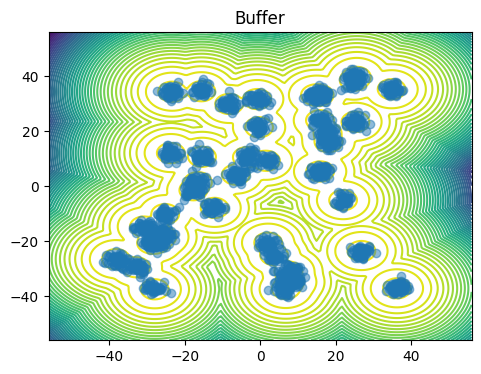

In [11]:
plot_dataset(unnorm_init_samples) # visualise the initial samples
plt.show()

In [33]:
def log_E_R(_x, _t, beta, num_mc_samples, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = beta * _t.repeat_interleave(num_mc_samples).unsqueeze(1)
    repeated_x = _x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = _t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    h_t  = beta * repeated_t
    h_t = h_t.unsqueeze(1)
    if var_exploding:
        # variance exploding
        samples = repeated_x + torch.randn(repeated_x.shape).to(device) * h_t ** 0.5
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    else:
        # variance preserving
        samples = repeated_x + torch.randn(repeated_x.shape).to(device) * h_t ** 0.5
        samples = samples * torch.sqrt(1 - repeated_t.unsqueeze(1))
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.log(1 / (1 - _t)) + torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    return log_expectation_R

In [13]:
def estimate_grad_Rt(x, t, beta, num_mc_samples=100, var_exploding=True, richardson=False):
    t = t * torch.ones(x.shape[0]).to(device)
    est_scores_n = torch.vmap(torch.func.grad(log_E_R), 
                            in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples, 
                                                                                  var_exploding=var_exploding)
    if richardson:
        est_scores_n_div2 = torch.vmap(torch.func.grad(log_E_R), 
                                   in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples//2, 
                                                                                         var_exploding=var_exploding)
        return (2*est_scores_n - est_scores_n_div2)
    else:
        return est_scores_n

In [14]:
def estimated_Rt(x, t, beta, num_mc_samples=100, var_exploding=True):
    t = t * torch.ones(x.shape[0]).to(device)
    return torch.vmap(log_E_R, 
                      randomness='different', in_dims=(0,0,None,None,None))(x, t, num_mc_samples, beta, var_exploding)

In [15]:
# @torch.vmap
def estimate_grad_Rt_IS(x, t, beta=1.0, global_mins=-50, global_maxs=50, num_mc_samples=100):
    def grad_fxn(_x, eps_i):
        # samples = repeated_x + torch.normal(torch.zeros_like(repeated_x), h_t.unsqueeze(1) ** 0.5)
        log_rewards = target.log_prob(unnormalize(_x + eps_i, global_mins, global_maxs)) #mc_samples
        return log_rewards

    repeated_x = x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    h_t  = beta * repeated_t
    eps_i = torch.randn(repeated_x.shape).to(device) * h_t ** 0.5
    x_i = repeated_x + eps_i

    log_denom = estimated_Rt(repeated_x, repeated_t.squeeze(), beta, num_mc_samples=num_mc_samples).detach() #num_mc_samples
    log_numer = target.log_prob(unnormalize(x_i, global_mins, global_maxs)).detach() #num_mc_samples

    log_IS_weights = log_numer - log_denom

    grad_log_R = torch.vmap(torch.func.grad(grad_fxn), randomness='different')(repeated_x, eps_i).detach() #num_mc_samples x 2

    return (log_IS_weights.exp().unsqueeze(1) * grad_log_R).mean(dim=0)

In [ ]:
# t = torch.rand(1, device=device)
# t = t * 0 + 0.05
# beta = 0.5
# h_t = beta * t

# num_mc_samples = 100

In [ ]:
# grad_Rt_hat = torch.vmap(estimate_grad_Rt_IS, in_dims=(0, None),
#                           randomness='different')(x, t, num_mc_samples=10, beta=beta).detach()
# grads_Rt_hat = []
# for i in range(x.shape[0]):
#     grad_Rt_hat = estimate_grad_Rt_IS(x[i], t, num_mc_samples=num_mc_samples, beta=beta).detach()
#     grads_Rt_hat.append(grad_Rt_hat)

# grad_Rt = true_grad_Rt(x, h_t).detach()
# grads_Rt_hat = torch.stack(grads_Rt_hat, dim=0)    

In [ ]:
# fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# vmin = grad_Rt.min()
# vmax = grad_Rt.max()

# im = axs[0].imshow(grad_Rt.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# # colorbar for subplot
# plt.colorbar(im, ax=axs[0])
# axs[0].set_title(r'True $\nabla \log R_t$')
# # del grad_Rt

# im = axs[1].imshow(grads_Rt_hat.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# plt.colorbar(im, ax=axs[1])
# axs[1].set_title(r'Estimated  IS $\nabla \log R_t$')
# plt.show()
# # del grad_Rt_hat
# # del grads_Rt_hat

# plt.show()

In [ ]:
# def estimate_grad_Rt(x, h_t, global_mins=-50, global_maxs=50):
#     num_mc_samples = 100
#     x_expanded = x.unsqueeze(1).expand(-1, num_mc_samples, -1)
#     x_prime = x_expanded + torch.normal(torch.zeros_like(x_expanded),
#                                                      h_t.unsqueeze(1).expand(-1, num_mc_samples, -1) ** 0.5)
#     samples_energy = target.log_prob(unnormalize(x_prime, global_mins, global_maxs))
#     samples_energy = torch.logsumexp(samples_energy, dim=1)
#     estimated_scores = torch.autograd.grad(samples_energy.sum(), x, retain_graph=True)[0].detach()
#     return estimated_scores

In [16]:
def true_Rt(x, t, beta, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = beta * t
    target.convolve(h_t * (50 **2), t, var_exploding=var_exploding)
    energy = target.log_prob(unnormalize(x, global_mins, global_maxs))
    target.reset()
    return energy

In [17]:
def true_grad_Rt(x, t, beta, var_exploding=True):
    samples_energy = true_Rt(x, t, beta, var_exploding=var_exploding)
    true_scores = torch.autograd.grad(samples_energy.sum(), x, retain_graph=True)[0].detach()
    return true_scores

In [19]:
# sample uniformly from the grid
num_grid = 100
X = torch.linspace(-1, 1, num_grid)
Y = torch.linspace(-1, 1, num_grid)

# create a grid of (x,y) coordinates
x = torch.meshgrid(X, Y)

# make x into tensor
x = torch.stack(x, dim=2).reshape(-1, 2)
x = x.to(device)
x.requires_grad = True

In [20]:
t = torch.rand(1, device=device)
t = t * 0  + 0.05
beta = 0.5

num_mc_samples = 100

In [ ]:
# grads_Rt = []
# grads_Rt_hat = []
# richardson_grads_Rt_hat = []

# num_iter = 1
# for i in tqdm(range(num_iter)):
#     grad_Rt = true_grad_Rt(x, t, beta).detach()
#     grad_Rt_hat = estimate_grad_Rt(x, t, beta, num_mc_samples=num_mc_samples).detach()
#     grad_Rt_hat_2n = estimate_grad_Rt(x, t, beta, num_mc_samples=num_mc_samples * 2).detach()
#     grads_Rt.append(grad_Rt)
#     grads_Rt_hat.append(grad_Rt_hat_2n)
#     richardson_grads_Rt_hat.append((2 * grad_Rt_hat_2n) - grad_Rt_hat)

# grads_Rt = torch.stack(grads_Rt, dim=0)
# grads_Rt_hat = torch.stack(grads_Rt_hat, dim=0)
# richardson_grads_Rt_hat = torch.stack(richardson_grads_Rt_hat, dim=0)

# richardson_grads_Rt_hat_baseline = (richardson_grads_Rt_hat - richardson_grads_Rt_hat.mean(0)).mean(0)

# grads_Rt = torch.mean(grads_Rt, dim=0)
# grads_Rt_hat = torch.mean(grads_Rt_hat, dim=0)
# richardson_grads_Rt_hat = torch.mean(richardson_grads_Rt_hat, dim=0)

In [ ]:
# fig, axs = plt.subplots(1, 3, figsize=(12, 4))

# vmin = grad_Rt.min()
# vmax = grad_Rt.max()

# im = axs[0].imshow(grad_Rt.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# # colorbar for subplot
# plt.colorbar(im, ax=axs[0])
# axs[0].set_title(r'True $\nabla \log R_t$')
# #del grad_Rt
# #del grads_Rt

# im = axs[1].imshow(grad_Rt_hat.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# plt.colorbar(im, ax=axs[1])
# axs[1].set_title(r'Estimated $\nabla \log R_t$')
# #del grad_Rt_hat
# #del grads_Rt_hat

# im = axs[2].imshow(richardson_grads_Rt_hat.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# plt.colorbar(im, ax=axs[2])
# axs[2].set_title(r'Estimated Richardson $\nabla \log R_t$')
# plt.show()

In [ ]:
t = torch.rand(1, device=device)
t = t * 0  + 0.05
beta = 0.5

num_mc_samples = 100

In [ ]:
grads_Rt = []
grads_Rt_hat = []
grads_Rt_hat_richardson = []

num_iter = 100
for i in tqdm(range(num_iter)):
    grads_Rt.append(true_grad_Rt(x, t, beta).detach())
    grads_Rt_hat.append(estimate_grad_Rt(x, t, beta, 
                                         num_mc_samples=num_mc_samples * 2).detach())
    grads_Rt_hat_richardson.append(estimate_grad_Rt(x, t, beta, 
                                         num_mc_samples=num_mc_samples * 2, richardson=True).detach())

grads_Rt = torch.stack(grads_Rt, dim=0)
grads_Rt_hat = torch.stack(grads_Rt_hat, dim=0)
grads_Rt_hat_richardson = torch.stack(grads_Rt_hat_richardson, dim=0)
grad_Rt = torch.mean(grads_Rt, dim=0)
grad_Rt_hat = torch.mean(grads_Rt_hat, dim=0)
richardson_grad_Rt_hat= torch.mean(grads_Rt_hat_richardson, dim=0)


del grads_Rt_hat
del grads_Rt
del grads_Rt_hat_richardson

100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


In [ ]:
grad_Rt_per_sample = []
grad_Rt_hat_per_sample = []
richardson_grad_Rt_hat_per_sample = []

num_iter = 50
num_samples_counter = 100
for i in tqdm(range(1, num_samples_counter)):
    num_mc_samples = 5 * num_samples_counter
    for i in range(num_iter):
        grads_Rt = []
        grads_Rt_hat = []
        grads_Rt_hat_richardson = []

        grads_Rt.append(true_grad_Rt(x, t, beta).detach())
        grads_Rt_hat.append(estimate_grad_Rt(x, t, beta, 
                                            num_mc_samples=num_mc_samples).detach())
        grads_Rt_hat_richardson.append(estimate_grad_Rt(x, t, beta, 
                                            num_mc_samples=num_mc_samples, richardson=True).detach())

    grads_Rt = torch.stack(grads_Rt, dim=0)
    grads_Rt_hat = torch.stack(grads_Rt_hat, dim=0)
    grads_Rt_hat_richardson = torch.stack(grads_Rt_hat_richardson, dim=0)
    grad_Rt = torch.mean(grads_Rt, dim=0).cpu()
    grad_Rt_hat = torch.mean(grads_Rt_hat, dim=0).cpu()
    richardson_grad_Rt_hat = torch.mean(grads_Rt_hat_richardson, dim=0).cpu()

    grad_Rt_per_sample.append(grad_Rt)
    grad_Rt_hat_per_sample.append(grad_Rt_hat)
    richardson_grad_Rt_hat_per_sample.append(richardson_grad_Rt_hat)

richardson_grad_Rt_hat_per_sample = torch.stack(richardson_grad_Rt_hat_per_sample, dim=0)
grad_Rt_per_sample = torch.stack(grad_Rt_per_sample, dim=0)
grad_Rt_hat_per_sample = torch.stack(grad_Rt_hat_per_sample, dim=0)

In [56]:
richardson_grad_Rt_hat_per_sample.shape

torch.Size([2, 10000, 2])

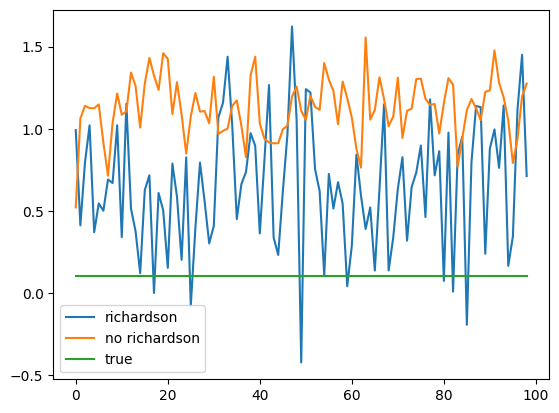

In [52]:
plt.plot(richardson_grad_Rt_hat_per_sample[:,0].cpu(), label='richardson')
plt.plot(grad_Rt_hat_per_sample[:,0].cpu(), label='no richardson')
plt.plot(grad_Rt_per_sample[:,0].cpu(), label='true')
plt.legend()

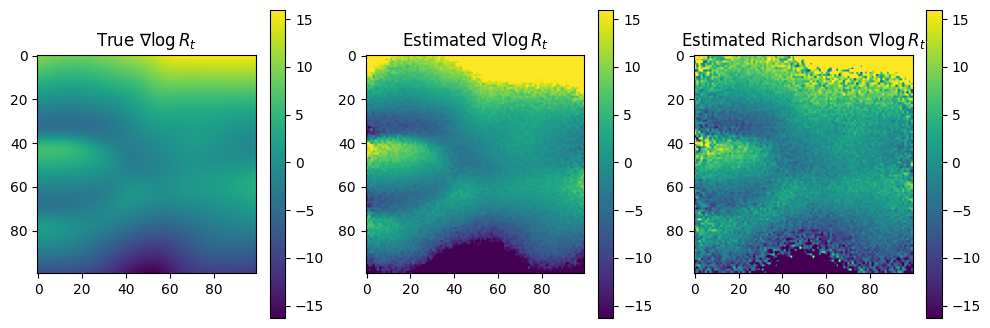

In [62]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

vmin = grad_Rt.min()
vmax = grad_Rt.max()

im = axs[0].imshow(grad_Rt.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0])
axs[0].set_title(r'True $\nabla \log R_t$')
#del grad_Rt
#del grads_Rt

im = axs[1].imshow(grad_Rt_hat.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
plt.colorbar(im, ax=axs[1])
axs[1].set_title(r'Estimated $\nabla \log R_t$')
#del grad_Rt_hat
#del grads_Rt_hat

im = axs[2].imshow(richardson_grad_Rt_hat.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
plt.colorbar(im, ax=axs[2])
axs[2].set_title(r'Estimated Richardson $\nabla \log R_t$')
plt.show()

In [51]:
t = torch.rand(1, device=device)
t = t * 0  + 0.5
beta = 0.5

num_mc_samples = 500

In [52]:
grads_Rt = []
grads_Rt_hat = []

num_iter = 50
for i in tqdm(range(num_iter)):
    grads_Rt.append(true_grad_Rt(x, t, beta, var_exploding=True).detach())
    grads_Rt_hat.append(estimate_grad_Rt(x, t, beta, 
                                         num_mc_samples=num_mc_samples, var_exploding=True).detach())

grads_Rt = torch.stack(grads_Rt, dim=0)
grads_Rt_hat = torch.stack(grads_Rt_hat, dim=0)
grad_Rt = torch.mean(grads_Rt, dim=0).cpu()
grad_Rt_hat = torch.mean(grads_Rt_hat, dim=0).cpu()


grads_Rt = []
grads_Rt_hat = []
for i in range(num_iter):
    grads_Rt.append(true_grad_Rt(x, t, beta, var_exploding=False).detach())
    grads_Rt_hat.append(estimate_grad_Rt(x, t, beta, 
                                         num_mc_samples=num_mc_samples, var_exploding=False).detach())

grads_Rt = torch.stack(grads_Rt, dim=0)
grads_Rt_hat = torch.stack(grads_Rt_hat, dim=0)
grad_Rt_preserve = torch.mean(grads_Rt, dim=0).cpu()
grad_Rt_hat_preserve  = torch.mean(grads_Rt_hat, dim=0).cpu()

del grads_Rt_hat
del grads_Rt

 14%|█▍        | 7/50 [00:01<00:10,  4.13it/s]

100%|██████████| 50/50 [00:12<00:00,  4.13it/s]


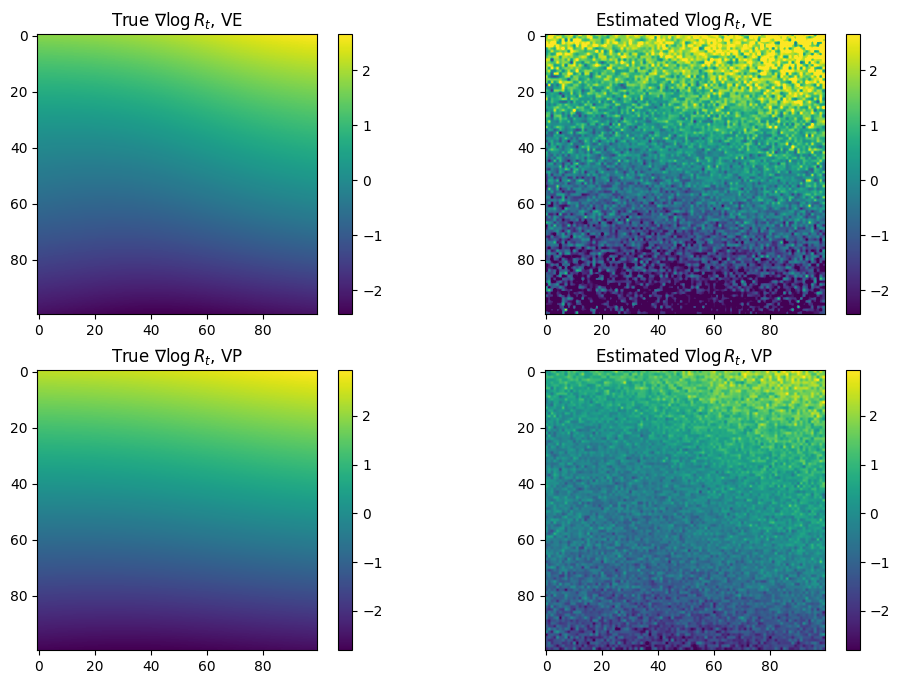

In [53]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# plot the variance exploding case
vmin = grad_Rt.min()
vmax = grad_Rt.max()

im = axs[0,0].imshow(grad_Rt.reshape(num_grid, num_grid, 2)[..., 0], vmin=vmin, vmax=vmax)
plt.colorbar(im, ax=axs[0,0])
axs[0,0].set_title(r'True $\nabla \log R_t$, VE')

im = axs[0,1].imshow(grad_Rt_hat.reshape(num_grid, num_grid, 2)[..., 0], vmin=vmin, vmax=vmax)
plt.colorbar(im, ax=axs[0,1])
axs[0,1].set_title(r'Estimated $\nabla \log R_t$, VE')

# plot the variance preserving case
vmin = grad_Rt_preserve.min()
vmax = grad_Rt_preserve.max()

im = axs[1,0].imshow(grad_Rt_preserve.reshape(num_grid, num_grid, 2)[..., 0], vmin=vmin, vmax=vmax)
plt.colorbar(im, ax=axs[1,0])
axs[1,0].set_title(r'True $\nabla \log R_t$, VP')

im = axs[1,1].imshow(grad_Rt_hat_preserve.reshape(num_grid, num_grid, 2)[..., 0], vmin=vmin, vmax=vmax)
plt.colorbar(im, ax=axs[1,1])
axs[1,1].set_title(r'Estimated $\nabla \log R_t$, VP')

plt.show()

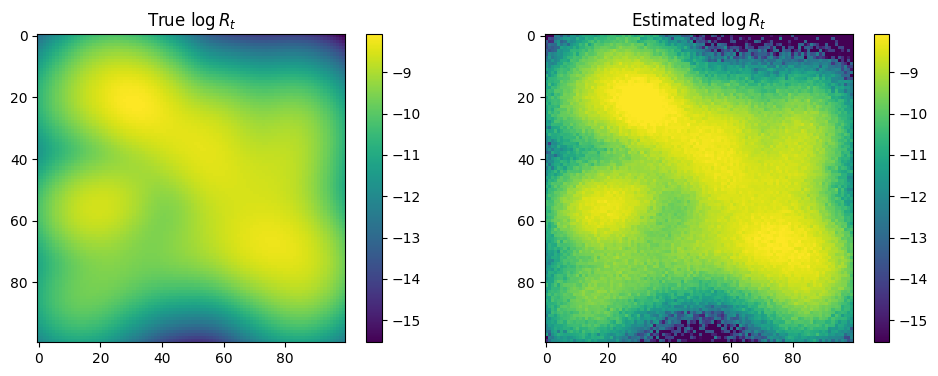

In [79]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

Rt = true_Rt(x, h_t).detach()
vmin = Rt.min()
vmax = Rt.max()

im = axs[0].imshow(Rt.reshape(num_grid, num_grid).cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0])
axs[0].set_title(r'True $\log R_t$')
del Rt


Rt_hat = estimated_Rt(x, t, num_mc_samples=num_mc_samples, beta=beta).detach()
im = axs[1].imshow(Rt_hat.reshape(num_grid, num_grid).detach().cpu(), vmin=vmin, vmax=vmax)
plt.colorbar(im, ax=axs[1])
del Rt_hat
axs[1].set_title(r'Estimated $\log R_t$')

plt.show()

In [123]:
def reward_matching_loss_biased(target, vectorfield, constant_noise_scale, global_mins, global_maxs, x, t):     
    t = t.unsqueeze(1)
    h_t = constant_noise_scale * t
    # pdb.set_trace()
    x.requires_grad = True

    # noisy sample: x(t)
    noisy_x = torch.normal(x, h_t ** 0.5)
    pred_scores = vectorfield(noisy_x, t.squeeze())

    estimated_scores = estimate_grad_Rt(noisy_x)
    return ((estimated_scores - pred_scores)**2).mean()

In [15]:
class VEReverseSDE(torch.nn.Module):
    noise_type = 'diagonal'
    sde_type = 'ito'
    
    def __init__(self, score_net):
        super().__init__()
        self.score_model = score_net
    
    def f(self, t, x):
        # pdb.set_trace()
        t = t.repeat(len(x)).to(x.device)
        score = self.score_model(x, 1-t)
        return self.g(t, x).pow(2) * score 
    
    def g(self, t, x):
        return torch.full_like(x, beta ** 0.5) #+ 0.1

In [16]:
def generate_samples(ve_reverse_sde):
    num_samples = 400
    target_sigma_squared = 0.0
    # x1 = torch.normal(torch.zeros((num_samples, 2)), torch.full((num_samples, 2), 
    # (target_sigma_squared + beta) ** 0.5)).to(device)
    x1 = torch.normal(torch.zeros((num_samples, 2)), torch.full((num_samples, 2), 
                                                                (target_sigma_squared + beta) ** 0.5)).to(device)
    t = torch.linspace(0.0, 1.0, 500)
    with torch.no_grad():
        samples = torchsde.sdeint(ve_reverse_sde, x1, t)
    return samples

In [17]:
def func(t, x):
    t = t.repeat(len(x)).to(x.device)
    return vectorfield(x, 1-t) / 2 * beta

def generate_ode_samples():
    num_samples = 400
    target_sigma_squared = 0.0
    x1 = torch.normal(torch.zeros((num_samples, 2)), torch.full((num_samples, 2), 
                                                                (target_sigma_squared + beta) ** 0.5)).to(device)
    t = torch.linspace(0.0, 1.0, 100)
    with torch.no_grad():
        samples = odeint(func, x1, t)
    return samples

### Networks

In [18]:
beta = 1
vectorfield = MyMLP().to(device)

opt_vectorfield = Adam(vectorfield.parameters())

In [19]:
buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
                      device=device, fill_buffer_during_init=False, sample_with_replacement=True)
buffer.add(init_samples, init_energy)

Buffer not initialised, expected that checkpoint will be loaded.


### Training Loop

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0 | Loss 10399.163086
Epoch 49 | Loss 3744.049316
Epoch 98 | Loss 4449.800781


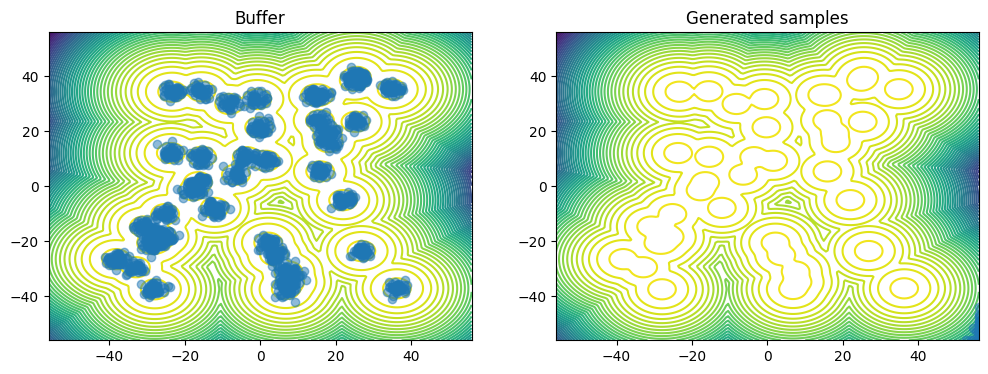

  1%|          | 1/100 [00:35<58:14, 35.29s/it]

Epoch 0 | Loss 2205.381348
Epoch 49 | Loss 2048.938965
Epoch 98 | Loss 3895.726074


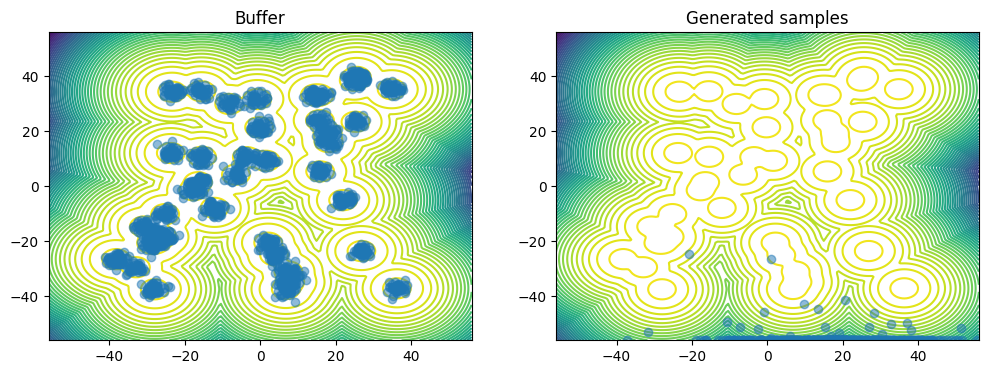

  2%|▏         | 2/100 [01:12<59:38, 36.51s/it]

Epoch 0 | Loss 3965.583740
Epoch 49 | Loss 4338.425293
Epoch 98 | Loss 4831.344238


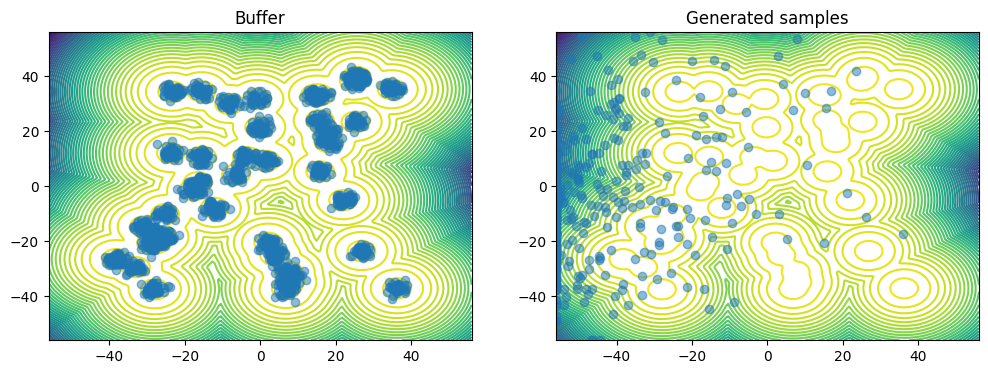

  3%|▎         | 3/100 [01:50<1:00:19, 37.32s/it]

Epoch 0 | Loss 3044.941406
Epoch 49 | Loss 3145.964844
Epoch 98 | Loss 3481.681641


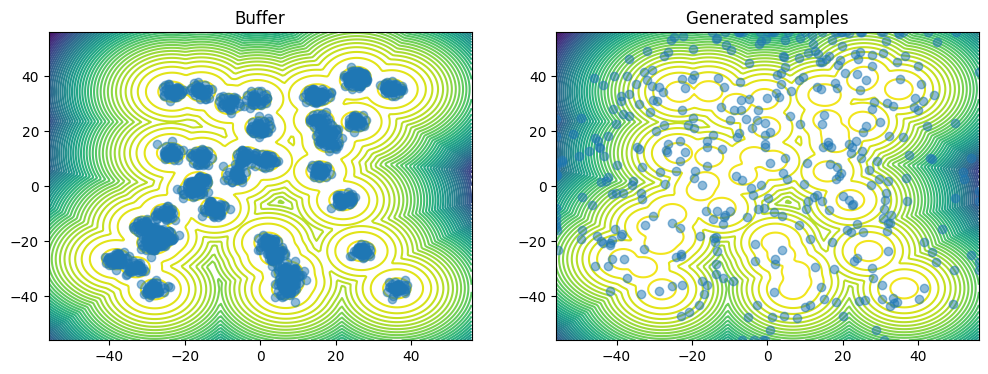

  4%|▍         | 4/100 [02:28<59:34, 37.24s/it]  

Epoch 0 | Loss 3554.899658
Epoch 49 | Loss 2333.310791
Epoch 98 | Loss 1832.324829


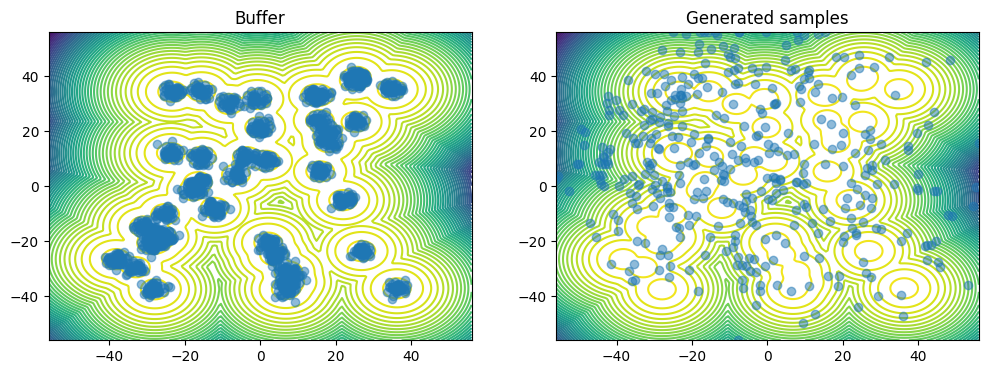

  5%|▌         | 5/100 [03:07<1:00:06, 37.97s/it]

Epoch 0 | Loss 3687.025635
Epoch 49 | Loss 3134.204102
Epoch 98 | Loss 1535.694336


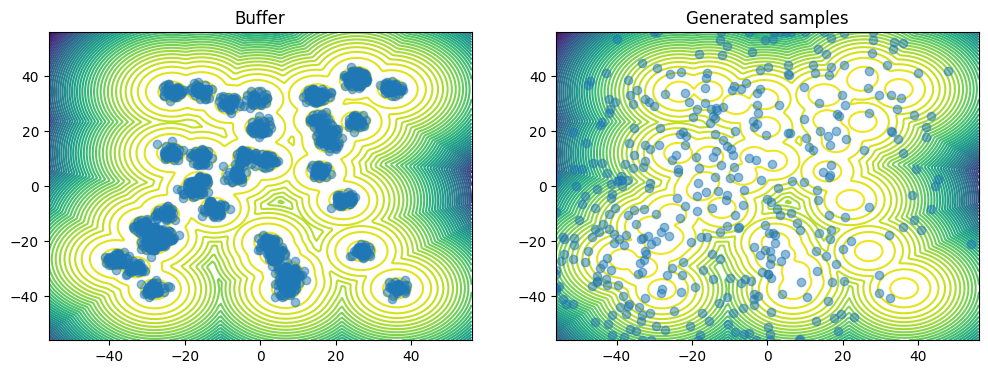

  6%|▌         | 6/100 [03:46<1:00:09, 38.40s/it]

Epoch 0 | Loss 1827.708008
Epoch 49 | Loss 2003.356445
Epoch 98 | Loss 2729.129883


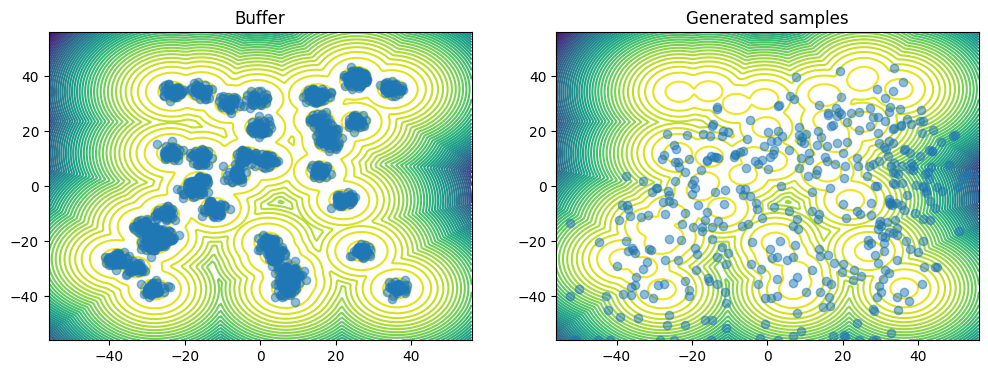

  7%|▋         | 7/100 [04:27<1:00:47, 39.22s/it]

Epoch 0 | Loss 3148.984375
Epoch 49 | Loss 3788.031982
Epoch 98 | Loss 3243.519043


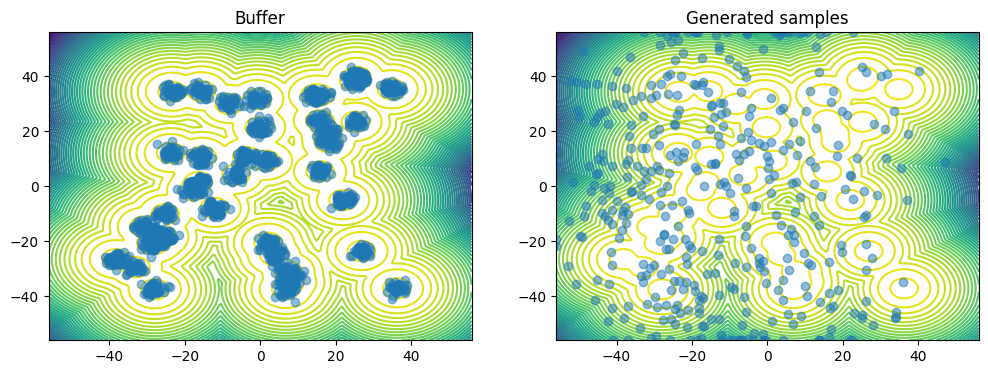

  8%|▊         | 8/100 [05:06<1:00:09, 39.23s/it]

Epoch 0 | Loss 4176.703613
Epoch 49 | Loss 3852.044189
Epoch 98 | Loss 2948.038818


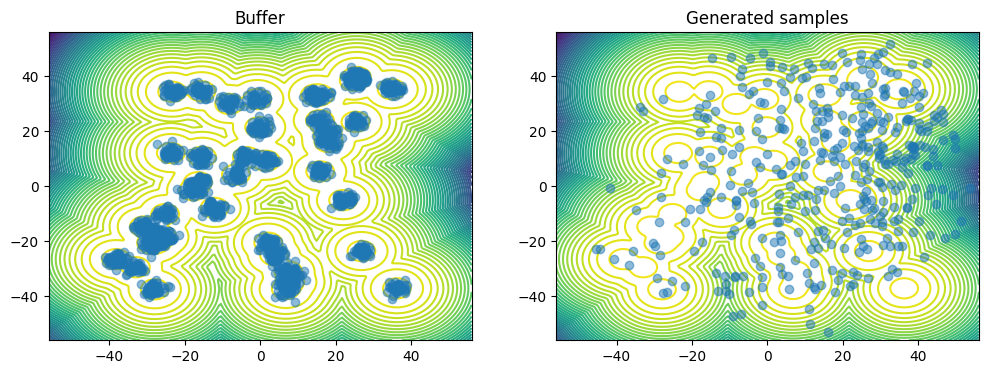

  9%|▉         | 9/100 [05:45<59:26, 39.19s/it]  

Epoch 0 | Loss 3299.237061
Epoch 49 | Loss 2265.834473
Epoch 98 | Loss 2567.266602


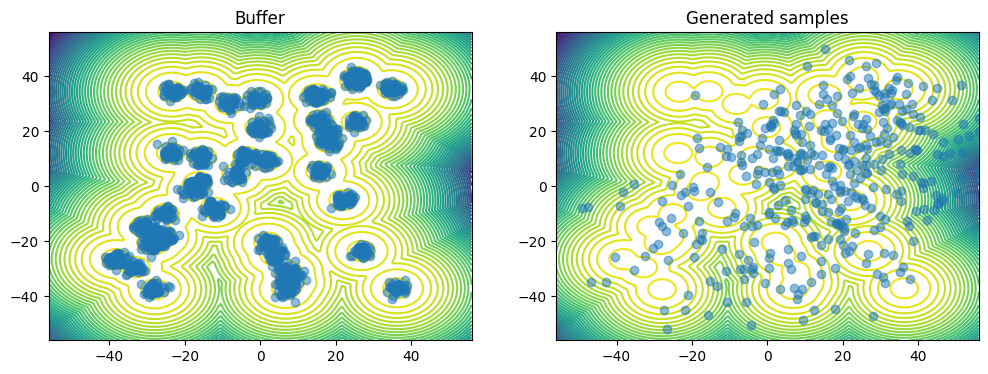

 10%|█         | 10/100 [06:25<58:57, 39.30s/it]

Epoch 0 | Loss 2547.113037
Epoch 49 | Loss 3739.870117
Epoch 98 | Loss 2148.077637


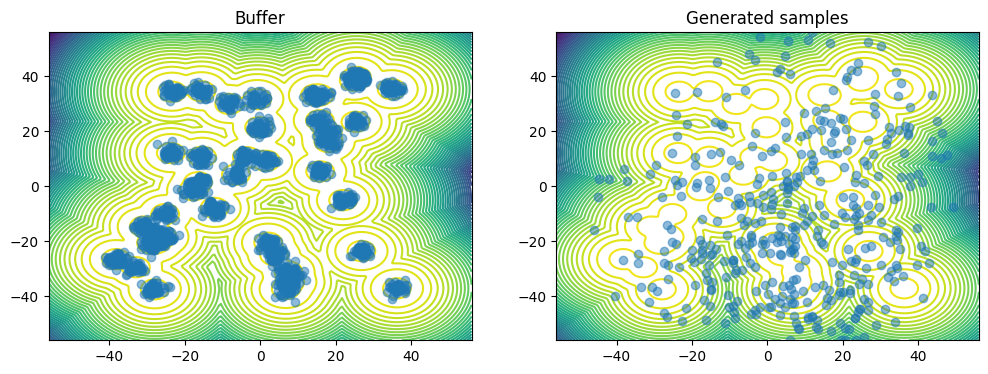

 11%|█         | 11/100 [07:04<58:03, 39.14s/it]

Epoch 0 | Loss 2064.582764
Epoch 49 | Loss 3420.051758
Epoch 98 | Loss 4003.017090


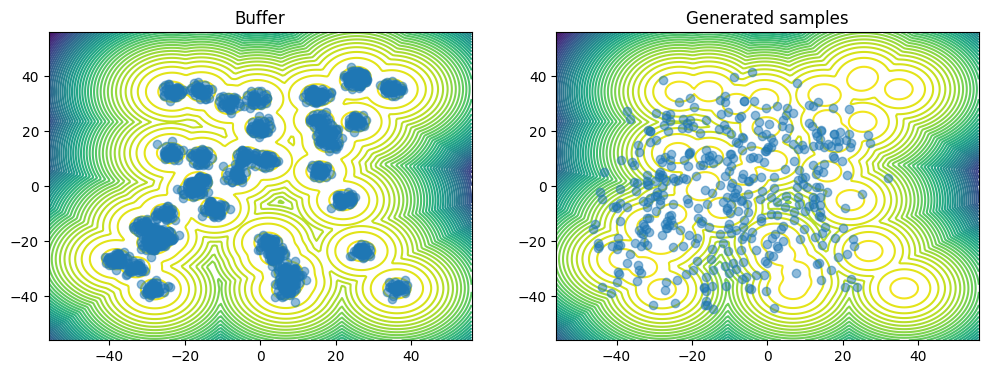

 12%|█▏        | 12/100 [07:42<57:15, 39.04s/it]

Epoch 0 | Loss 5867.093750
Epoch 49 | Loss 2052.484619
Epoch 98 | Loss 2839.284668


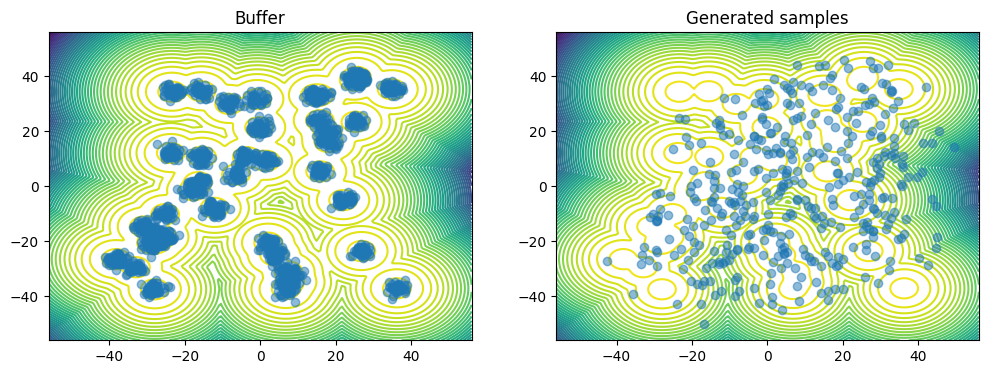

 13%|█▎        | 13/100 [08:21<56:18, 38.83s/it]

Epoch 0 | Loss 2287.435547
Epoch 49 | Loss 2296.496582
Epoch 98 | Loss 3974.382324


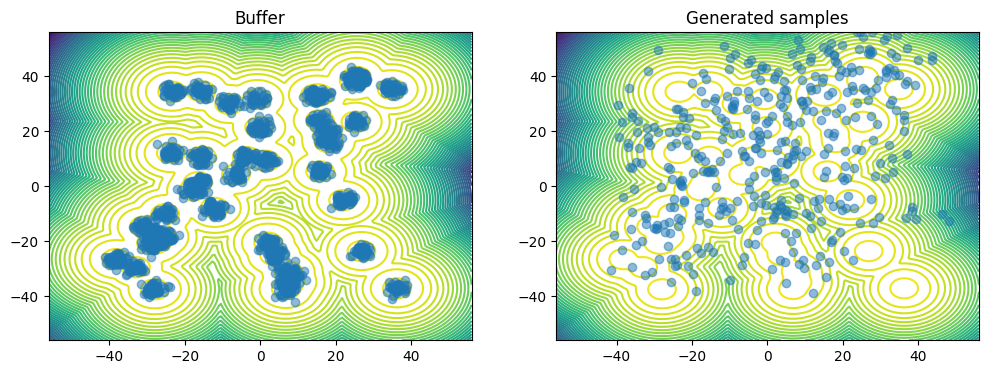

 14%|█▍        | 14/100 [09:01<56:03, 39.11s/it]

Epoch 0 | Loss 3079.921875
Epoch 49 | Loss 3020.678467
Epoch 98 | Loss 2976.338623


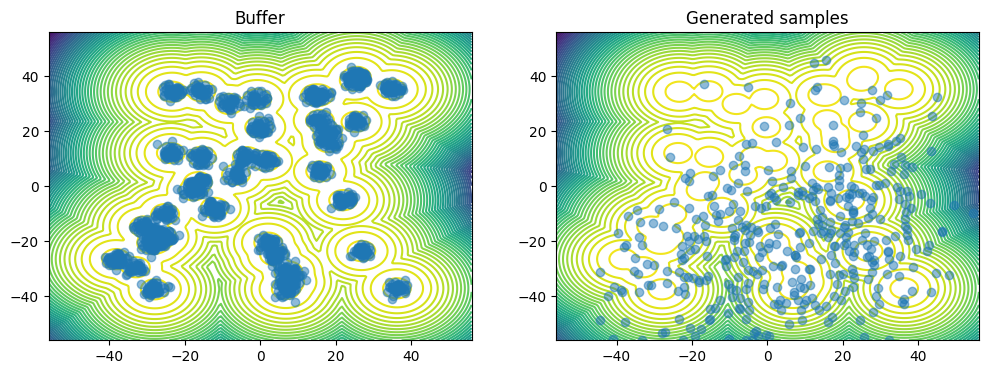

 15%|█▌        | 15/100 [09:40<55:32, 39.21s/it]

Epoch 0 | Loss 1592.640259
Epoch 49 | Loss 2386.566895
Epoch 98 | Loss 3581.904541


 15%|█▌        | 15/100 [10:04<57:03, 40.28s/it]


KeyboardInterrupt: 

In [192]:
outer_epochs= 100
inner_epochs = 100

num_samples = 2048 

train_dataset = TensorDataset(init_samples.clone(), init_energy.clone())
trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True) 
global_mins, global_maxs = global_mins_init, global_maxs_init
ve_reverse_sde = VEReverseSDE(vectorfield).to(device)


for epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        total_loss = 0.
        for samples,_ in trainloader:
            samples = samples.to(device)
            opt_vectorfield.zero_grad()
            t = torch.rand(len(samples), device=device)
            loss = reward_matching_loss_biased(target, vectorfield, 1, global_mins, global_maxs, samples, t)
            total_loss += loss.item()
            loss.backward()
            opt_vectorfield.step()
        if epoch % 49 == 0:
            print("Epoch %d | Loss %f" % (epoch, loss.item()))


    # Generate samples using the vector field
    samples = generate_samples(ve_reverse_sde)[-1]
    # samples = generate_ode_samples()[-1]
    samples_energy = target.log_prob(unnormalize(samples, global_mins, global_maxs)).detach()

    # Update Buffer 
    # buffer.add(samples, samples_energy)

    plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
                 unnormalize(samples, global_mins, global_maxs))
    plt.show()
    # Resample data from the buffer
    # samples, samples_energy, _ = buffer.sample(512 * 10)
    # train_dataset = TensorDataset(samples, samples_energy)
    # trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True)

### Sampling

In [ ]:
plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
             unnormalize(samples[-1], global_mins, global_maxs))
